In [2]:
import os
import time

import librosa
import numpy as np

import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

import matplotlib.pyplot as plt
import IPython.display as ipd

In [3]:
a = '/data2/personal/jaejun/inpainting/results/210719/1/models'

In [7]:
from pathlib import Path

In [12]:
Path(a).parent

PosixPath('/data2/personal/jaejun/inpainting/results/210719/1')

In [3]:
os.makedirs('test', exist_ok=True)

In [7]:
zeros_5 = torch.zeros([1, 44100*5])
zeros_50 = torch.zeros([1, 44100*50])

In [11]:
for i in range(100):
    torchaudio.save(os.path.join('test', str(i) + '_5.wav'), zeros_5, sample_rate=44100)
    torchaudio.save(os.path.join('test', str(i) + '_50.wav'), zeros_50, sample_rate=44100)
    

In [27]:
start = time.time()  # 시작 시간 저장
for i in range(100):
    torchaudio.load(os.path.join('test', str(i) + '_5.wav'))
print("time :", np.round(time.time() - start, 10))

start = time.time()  # 시작 시간 저장
for i in range(100):
    dat = torchaudio.info(os.path.join('test', str(i) + '_5.wav'))
    torchaudio.load(os.path.join('test', str(i) + '_5.wav'))
print("time :", np.round(time.time() - start, 10))

time : 0.309643507
time : 0.2878096104


In [28]:
start = time.time()  # 시작 시간 저장
for i in range(100):
    torchaudio.load(os.path.join('test', str(i) + '_50.wav'))
print("time :", np.round(time.time() - start, 3))

start = time.time()  # 시작 시간 저장
for i in range(100):
    dat = torchaudio.info(os.path.join('test', str(i) + '_50.wav'))
    torchaudio.load(os.path.join('test', str(i) + '_50.wav'), frame_offset=0, num_frames=44100*5)
print("time :", np.round(time.time() - start, 3))

time : 2.404
time : 0.242


In [40]:
dat = torchaudio.info(os.path.join('test', str(i) + '_50.wav'))
num_frames = dat.num_frames

In [33]:
np.floor(np.random.random(1) * (44100*10-44100*5))

array([91339.])

In [30]:
np.random.random(1)

array([0.56742933])

In [34]:
np.random.randint(44100*10-44100*5)

203492

In [41]:
np.random.randint(num_frames-44100*5)

1406781

In [42]:
z

ValueError: low >= high

In [49]:
zeros_5[0, -100:100].shape

torch.Size([0])

In [56]:
# np.random.randint(0)
torch.nn.functional.pad(zeros_5, (0, 44100*5-44100*5), mode='constant', value=0)

tensor([[0., 0., 0.,  ..., 0., 0., 0.]])

In [61]:
test = torch.ones([1, 49999])
print(test.shape)
test2 = torch.nn.functional.pad(test, (0, 50000-test.shape[-1]), mode='constant', value=0)
test2.shape

torch.Size([1, 49999])


torch.Size([1, 50000])

In [15]:
import os
import cv2
import time
import argparse
import librosa
import numpy as np

import torch
import torchaudio
import torchaudio.transforms as T
from torch.utils import data
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

import matplotlib
import matplotlib.pyplot as plt
from IPython.display import Audio, display

import easydict
from sklearn.model_selection import train_test_split
ALLMASKTYPES = ['time', 'bbox', 'freeform']

def plot_spectrogram(spec, ax , title=None, ylabel='freq_bin', aspect='auto', xmax=None):
#   ax.set_title(title or 'Spectrogram (db)')
#   ax.set_ylabel(ylabel)
#   ax.set_xlabel('frame')
  im = ax.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  if xmax:
    ax.set_xlim((0, xmax))
  return im

In [4]:
class InpaintDataset(Dataset):
    def __init__(self, opt, split):
        self.opt = opt
        self.split = split
        
        self.get_list()
        
    def __getitem__(self, index):
        audio = self.get_audio(index)
        # spec = self.get_comlex_spectrogram(audio)
        spec = self.get_spectrogram(audio).unsqueeze(-1)

        if self.split == 'TRAIN':
            if self.opt.mask_type == 'time':
                mask = self.time_mask()
            if self.opt.mask_type == 'bbox':
                mask = self.bbox2mask()
            if self.opt.mask_type == 'freeform':
                mask = self.random_ff_mask()
        elif self.split in ['VALID', 'TEST']:
            if self.opt.mask_type == 'time':
                masks_dir = '../split/fixedmask_time'
                mask = np.load(os.path.join(masks_dir, str(index)))
            if self.opt.mask_type == 'bbox':
                masks_dir = '../split/fixedmask_bbox'
                mask = np.load(os.path.join(masks_dir, str(index)))
            if self.opt.mask_type == 'freeform':
                masks_dir = '../split/fixedmask_freeform'
                mask = np.load(os.path.join(masks_dir, str(index)))

        spec = spec.squeeze(0).permute(2, 0, 1).contiguous()
        mask = torch.from_numpy(mask.astype(np.float32)).contiguous()

        return spec, mask
    
    def get_list(self):
        margs_trainvalid = np.loadtxt('../split/margs_trainvalid.txt', delimiter=',', dtype=str)
        margs_test = np.loadtxt('../split/margs_test.txt', delimiter=',', dtype=str)
        nuss_trainvalid = np.loadtxt('../split/nuss_trainvalid.txt', delimiter=',', dtype=str)
        nuss_test = np.loadtxt('../split/nuss_test.txt', delimiter=',', dtype=str)
        vocals_trainvalid = np.loadtxt('../split/vocals_trainvalid.txt', delimiter=',', dtype=str)
        vocals_test = np.loadtxt('../split/vocals_test.txt', delimiter=',', dtype=str)

        margs_train, margs_valid = train_test_split(margs_trainvalid, test_size=0.1, shuffle=False, random_state=21)
        nuss_train, nuss_valid = train_test_split(nuss_trainvalid, test_size=0.1, shuffle=False, random_state=21)
        vocals_train, vocals_valid = train_test_split(vocals_trainvalid, test_size=0.1, shuffle=False, random_state=21)

        if self.split == 'TRAIN':
            train_list = self.dataset_merge(list(margs_train) + list(nuss_train) + list(vocals_train))
            self.fl = train_list
        elif self.split == 'VALID':
            valid_list = self.dataset_merge(list(margs_valid) + list(nuss_valid) + list(vocals_valid))
            self.fl = valid_list
        elif self.split == 'TEST':
            test_list = self.dataset_merge(list(margs_test) + list(nuss_test) + list(vocals_test))
            self.fl = test_list
    
    def dataset_merge(self, dataset):
        merged_dataset = []
        for ix, lis in enumerate(dataset):
            dat = torchaudio.info(os.path.join(self.opt.data_dir, lis))
            if dat.num_frames > 44100*2.5:
                merged_dataset.append(lis)
        return merged_dataset

    def get_audio(self, index):
        fn = self.fl[index]
        audio_path = os.path.join(self.opt.data_dir, fn)
        num_frames = torchaudio.info(audio_path).num_frames
        if num_frames <= self.opt.input_length:
            audio, sr = torchaudio.load(audio_path)
            audio = torch.nn.functional.pad(audio, (0, self.opt.input_length-num_frames), mode='constant', value=0)
        else:
            random_idx = np.random.randint(num_frames - self.opt.input_length)
            audio, sr = torchaudio.load(audio_path, frame_offset=random_idx, num_frames=self.opt.input_length)
        return audio

    def get_comlex_spectrogram(self, waveform, n_fft = 1024, win_len = 1024, hop_len = 512, power=None):
        spectrogram = T.Spectrogram(
        n_fft=n_fft,
        win_length=win_len,
        hop_length=hop_len,
        center=True,
        pad_mode="reflect",
        power=power,
        return_complex=0,
        )
        return spectrogram(waveform)

    def get_spectrogram(self, waveform, n_fft = 1024, win_len = 1024, hop_len = 512, power=2):
        spectrogram = T.Spectrogram(
        n_fft=n_fft,
        win_length=win_len,
        hop_length=hop_len,
        center=True,
        pad_mode="reflect",
        power=power,
        )
        return spectrogram(waveform)

    def random_bbox(self):
        max_freq_ix = self.opt.image_height - self.opt.bbox_shape
        max_frame_ix = self.opt.image_width - self.opt.bbox_shape

        box_freq_ix = np.random.randint(max_freq_ix)
        box_frame_ix = np.random.randint(max_frame_ix)

        return (box_freq_ix, box_frame_ix, self.opt.bbox_shape, self.opt.bbox_shape)

    def time_mask(self):
        mask_width = np.random.randint(low=8, high=87)
        max_frame_ix = self.opt.image_width - mask_width
        t = np.random.randint(max_frame_ix)
        mask = np.zeros((self.opt.image_height, self.opt.image_width))
        mask[:,t:t+mask_width] = 1
        return mask.reshape((1, ) + mask.shape).astype(np.float32)

    def bbox2mask(self):
        bboxs = []
        times = np.random.randint(8)
        for i in range(times):
            bbox = self.random_bbox()
            bboxs.append(bbox)
        mask = np.zeros((self.opt.image_height, self.opt.image_width), np.float32)
        for bbox in bboxs:
            h = int(bbox[2] * 0.1) + np.random.randint(int(bbox[2] * 0.2 + 1))
            w = int(bbox[3] * 0.1) + np.random.randint(int(bbox[3] * 0.2) + 1)
            mask[(bbox[0] + h) : (bbox[0] + bbox[2] - h), (bbox[1] + w) : (bbox[1] + bbox[3] - w)] = 1.
        return mask.reshape((1, ) + mask.shape).astype(np.float32)

    def random_ff_mask(self):
        """Generate a random free form mask with configuration.
        Args:
            config: Config should have configuration including IMG_SHAPES,
                VERTICAL_MARGIN, HEIGHT, HORIZONTAL_MARGIN, WIDTH.
        Returns:
            tuple: (top, left, height, width)
        """
        mask = np.zeros((self.opt.image_height, self.opt.image_width), np.float32)
        max_angle = 4
        max_len = 200
        max_width = 20
        times = np.random.randint(7)
        for i in range(times):
            start_x = np.random.randint(self.opt.image_width)
            start_y = np.random.randint(self.opt.image_height)
            for j in range(1 + np.random.randint(5)):
                angle = 0.01 + np.random.randint(max_angle)
                if i % 2 == 0:
                    angle = 2 * 3.1415926 - angle
                length = 10 + np.random.randint(max_len)
                brush_w = 5 + np.random.randint(max_width)
                end_x = (start_x + length * np.sin(angle)).astype(np.int32)
                end_y = (start_y + length * np.cos(angle)).astype(np.int32)
                cv2.line(mask, (start_y, start_x), (end_y, end_x), 1.0, brush_w)
                start_x, start_y = end_x, end_y
        return mask.reshape((1, ) + mask.shape).astype(np.float32)

    def __len__(self):
        return len(self.fl)

In [9]:
opt = easydict.EasyDict({
    "data_dir": '../dataset',
    "input_length": 220500,
    "image_height": 513,
    "image_width": 431,
    "bbox_shape": 120,
    "mask_type": 'time',
    "batch_size": 2,
    "num_workers": 8,
    })

In [10]:
trainset = InpaintDataset(opt, split='TRAIN')
print('The overall number of images equals to %d' % len(trainset))

# Define the dataloader
dataloader = DataLoader(trainset, batch_size = opt.batch_size, shuffle = True, num_workers = opt.num_workers, pin_memory = True)
    

The overall number of images equals to 6605


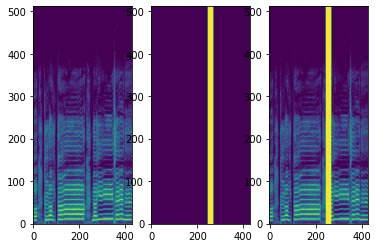

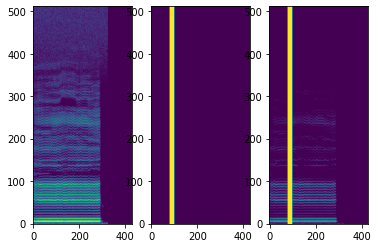

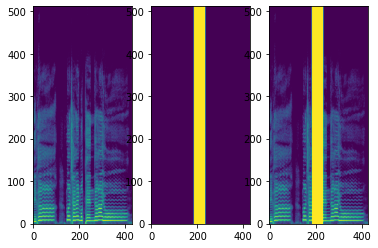

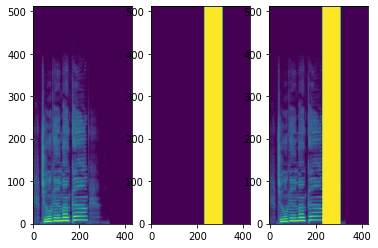

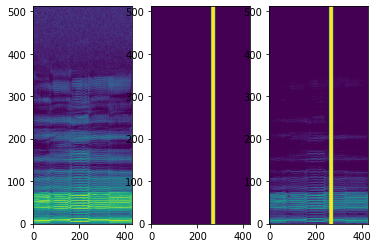

...

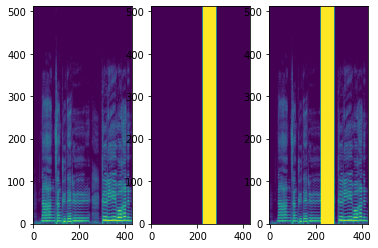

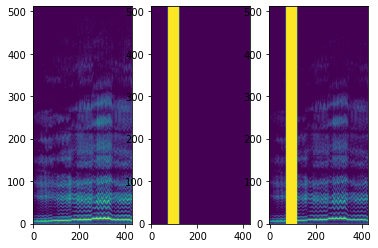

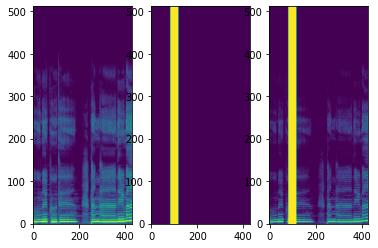

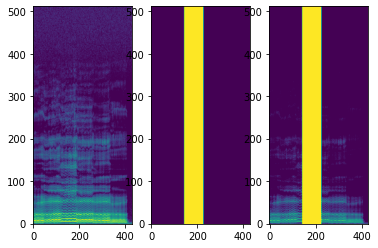

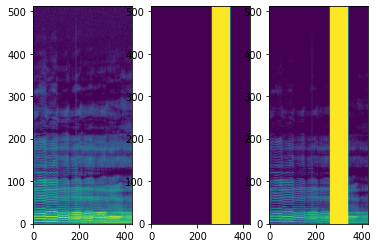

KeyboardInterrupt: 

In [16]:
for batch_idx, (img, mask) in enumerate(dataloader):
    # Load mask (shape: [B, 1, H, W]), masked_img (shape: [B, 3, H, W]), img (shape: [B, 3, H, W]) and put it to cuda
    scaler = 10000
    img = img / scaler
    img = img[0,0,:512,:428]
    mask = mask[0,0,:512,:428]
    masked_gt = img * (1 - mask) + mask
    masked_gt = masked_gt * scaler
    
    fig, axes = plt.subplots(1, 3)
    plot_spectrogram(img, axes[0])
    plot_spectrogram(mask*255, axes[1])
    plot_spectrogram(masked_gt, axes[2])
    plt.show()
    time.sleep(1)

In [75]:
dir_ = '/data4/skt/data/jamendo/mp3'
folders = os.listdir(dir_)
folder = folders[20]
songs = os.listdir(os.path.join(dir_, folder))
song = songs[25]

In [53]:
song_dir = os.path.join(dir_, folder, song)
song_length = torchaudio.info(song_dir).num_frames
# frame_offset = np.random.choice(song_length)
frame_offset = 0
num_frames = 30*sr
y, sr = torchaudio.load(song_dir, frame_offset=frame_offset, num_frames=num_frames)
ipd.Audio(y, rate=sr)

In [88]:
make_spec = torchaudio.transforms.Spectrogram(n_fft=1024)
make_complex_spec = torchaudio.transforms.Spectrogram(n_fft=1024, power=None)
y_spec = make_spec(y[0])
y_complex_spec = make_complex_spec(y[0])

In [89]:
y_spec.shape, y_complex_spec.shape

(torch.Size([513, 2584]), torch.Size([513, 2584, 2]))

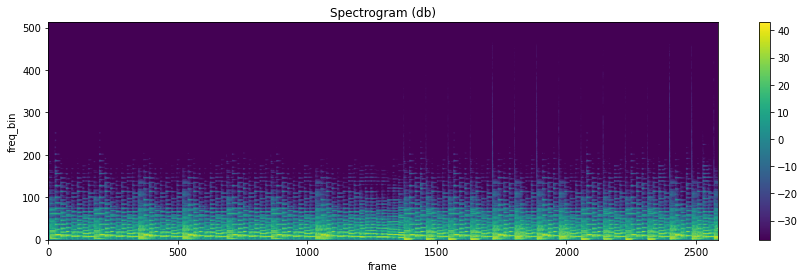

In [96]:
plot_spectrogram(y_spec)

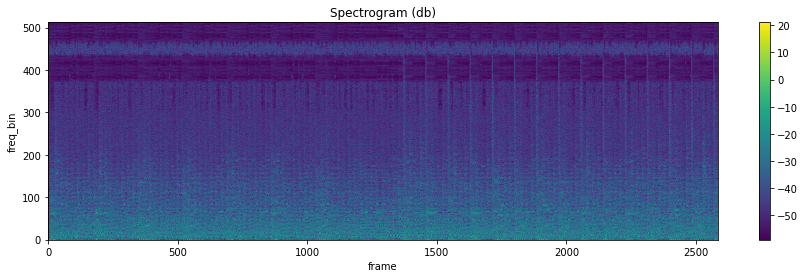

In [99]:
plot_spectrogram(y_complex_spec[:,:,0])

In [2]:
import os
import cv2
import numpy as np
import torch
from torchvision import transforms
from torch.utils.data import Dataset
import matplotlib.pyplot as plt


In [3]:
def random_ff_mask(shape, max_angle = 4, max_len = 40, max_width = 10, times = 15):
    """Generate a random free form mask with configuration.
    Args:
        config: Config should have configuration including IMG_SHAPES,
            VERTICAL_MARGIN, HEIGHT, HORIZONTAL_MARGIN, WIDTH.
    Returns:
        tuple: (top, left, height, width)
    """
    height = shape
    width = shape
    mask = np.zeros((height, width), np.float32)
    times = np.random.randint(times)
    for i in range(times):
        start_x = np.random.randint(width)
        start_y = np.random.randint(height)
        for j in range(1 + np.random.randint(5)):
            angle = 0.01 + np.random.randint(max_angle)
            if i % 2 == 0:
                angle = 2 * 3.1415926 - angle
            length = 10 + np.random.randint(max_len)
            brush_w = 5 + np.random.randint(max_width)
            end_x = (start_x + length * np.sin(angle)).astype(np.int32)
            end_y = (start_y + length * np.cos(angle)).astype(np.int32)
            cv2.line(mask, (start_y, start_x), (end_y, end_x), 1.0, brush_w)
            start_x, start_y = end_x, end_y
    return mask.reshape((1, ) + mask.shape).astype(np.float32)

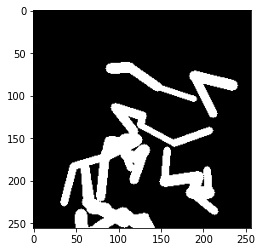

In [17]:
mask_1 = random_ff_mask(256, 256)
plt.imshow(cv2.cvtColor(mask_1[0], cv2.COLOR_BGR2RGB))

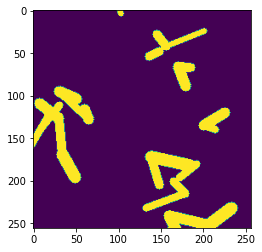

In [9]:
plt.imshow(mask_1[0])

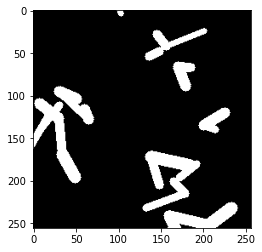

In [11]:
plt.show()